In [1]:
# Cell 1
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import io
import os
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import random
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import load_model
from keras.utils import custom_object_scope

C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\473662462.py:24: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\473662462.py:24: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\473662462.py:24: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\473662462.py:24: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is depr

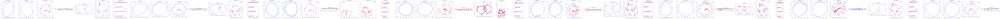

Number of processed files: 53
Average number of data points: 3372


In [11]:
# Cell 2
# Updated function
# Updated function without saving data inside
def upload_and_process_files(directory, num_files_to_use=None):
    svc_files = [f for f in os.listdir(directory) if f.endswith('.svc')]
    
    # If num_files_to_use is specified, only take that many files sequentially
    if num_files_to_use:
        svc_files = svc_files[:num_files_to_use]  # Take the first num_files_to_use files

    data_frames = []  # Processed data after scaling
    original_data_frames = []  # Save the original unscaled data
    scalers = []
    input_filenames = []  # List to store input filenames

    num_files = len(svc_files)
    fig, axs = plt.subplots(1, num_files, figsize=(6*num_files, 6), constrained_layout=True)
    if num_files == 1:
        axs = [axs]

    for i, filename in enumerate(svc_files):
        file_path = os.path.join(directory, filename)
        input_filenames.append(filename)  # Store the filename
        df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
        df.columns = ['x', 'y', 'timestamp', 'pen_status', 'pressure', 'azimuth', 'altitude']
        
        # Modify timestamp to start from 0
        df['timestamp'] = (df['timestamp'] - df['timestamp'].min()).round().astype(int)
        
        # Keep a copy of the original data before scaling
        original_data_frames.append(df.copy())  # Save the original unmodified data
        
        # Process the data for use in the model
        df = df.iloc[:, [0, 1, 2, 3, 4, 5, 6]] 
        data_frames.append(df)
        scaler = MinMaxScaler()
        normalized_data = scaler.fit_transform(df[['x', 'y', 'timestamp']])
        scalers.append(scaler)

        on_paper = df[df['pen_status'] == 1]
        in_air = df[df['pen_status'] == 0]
        axs[i].scatter(-on_paper['y'], on_paper['x'], c='blue', s=1, alpha=0.7, label='On Paper')
        axs[i].scatter(-in_air['y'], in_air['x'], c='red', s=1, alpha=0.7, label='In Air')
        axs[i].set_title(f'Original Data {i + 1}')
        axs[i].set_xlabel('-y')
        axs[i].set_ylabel('x')
        axs[i].legend()
        axs[i].set_aspect('equal')

    plt.show()

    processed_data = [np.column_stack((scaler.transform(df[['x', 'y', 'timestamp']]), df['pen_status'].values)) 
                      for df, scaler in zip(data_frames, scalers)]
    avg_data_points = int(np.mean([df.shape[0] for df in data_frames]))

    return data_frames, processed_data, scalers, avg_data_points, input_filenames, original_data_frames  # Return original data

# Save data outside the function
def save_original_data(data_frames, input_filenames, output_folder='original_absolute'):
    os.makedirs(output_folder, exist_ok=True)
    for df, filename in zip(data_frames, input_filenames):
        save_path = os.path.join(output_folder, filename)
        df.to_csv(save_path, sep=' ', index=False, header=False)

directory = 'datasets/tenth_iteration'  # Directory where the .svc files are stored
num_files_to_use = 53
data_frames, processed_data, scalers, avg_data_points, input_filenames, original_data_frames = upload_and_process_files(directory, num_files_to_use)

# Save the original data after processing
save_original_data(original_data_frames, input_filenames)

# Store the name of the first file for use in Cell 4
input_filename = input_filenames[0] if input_filenames else 'processed_data'
print(f"Number of processed files: {len(processed_data)}")
print(f"Average number of data points: {avg_data_points}")


In [12]:
# Cell 6 (modified)
class VAE(tf.keras.Model):
    def __init__(self, latent_dim, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(4,)),
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(32, activation='relu'),
            tf.keras.layers.Dense(latent_dim * 2)
        ])
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(32, activation='relu'),
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(4)
        ])

    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean

    def decode(self, z):
        decoded = self.decoder(z)
        xy_timestamp = tf.sigmoid(decoded[:, :3])
        pen_status = tf.sigmoid(decoded[:, 3])
        return tf.concat([xy_timestamp, tf.expand_dims(pen_status, -1)], axis=1)

    def call(self, inputs):
        mean, logvar = self.encode(inputs)
        z = self.reparameterize(mean, logvar)
        return self.decode(z), mean, logvar

    @classmethod
    def from_config(cls, config):
        config.pop('trainable', None)
        config.pop('dtype', None)
        return cls(**config)

    def get_config(self):
        config = super(VAE, self).get_config()
        config.update({
            'latent_dim': self.latent_dim
        })
        return config


# New: LSTM Discriminator for GAN
class LSTMDiscriminator(tf.keras.Model):
    def __init__(self):
        super(LSTMDiscriminator, self).__init__()
        self.model = Sequential()
        self.model.add(LSTM(64, return_sequences=True, input_shape=(None, 4)))  # LSTM for sequence learning
        self.model.add(LSTM(32))
        self.model.add(Dense(1, activation='sigmoid'))  # Binary classification

    def call(self, x):
        return self.model(x)


# Function to compute VAE loss
def compute_loss(model, x):
    x_reconstructed, mean, logvar = model(x)
    reconstruction_loss_xy_timestamp = tf.reduce_mean(tf.keras.losses.mse(x[:, :3], x_reconstructed[:, :3]))
    reconstruction_loss_pen = tf.reduce_mean(tf.keras.losses.binary_crossentropy(x[:, 3], x_reconstructed[:, 3]))
    kl_loss = -0.5 * tf.reduce_mean(1 + logvar - tf.square(mean) - tf.exp(logvar))
    return reconstruction_loss_xy_timestamp + reconstruction_loss_pen, kl_loss, kl_loss


# Parameters for VAE
latent_dim = 512
learning_rate = 0.001

vae = VAE(latent_dim)
optimizer = tf.keras.optimizers.Adam(learning_rate)


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [13]:
# Cell 7 (modified)
def generate_augmented_data(model, num_augmented_files, avg_data_points, processed_data, base_latent_variability=1.0, latent_variability_range=(0.5, 2.0)):
    augmented_datasets = []
    num_input_files = len(processed_data)
    
    for i in range(num_augmented_files):
        selected_data = processed_data[i % num_input_files]
        original_data = data_frames[i % num_input_files]
        pressure_azimuth_altitude = original_data[['pressure', 'azimuth', 'altitude']].values
        
        latent_variability = base_latent_variability * np.random.uniform(latent_variability_range[0], latent_variability_range[1])
        
        mean, logvar = model.encode(tf.convert_to_tensor(selected_data, dtype=tf.float32))
        z = model.reparameterize(mean, logvar * latent_variability)
        
        augmented_data = model.decode(z).numpy()

        augmented_data[:, 3] = post_process_pen_status(augmented_data[:, 3])
        augmented_data[:, 2] = np.sort(augmented_data[:, 2])
        augmented_data = np.column_stack((augmented_data, pressure_azimuth_altitude[:augmented_data.shape[0]]))
        
        augmented_datasets.append(augmented_data)

    return augmented_datasets

# The post_process_pen_status function remains unchanged
def post_process_pen_status(pen_status, threshold=0.5, min_segment_length=5):
    binary_pen_status = (pen_status > threshold).astype(int)
    
    # Smooth out rapid changes
    for i in range(len(binary_pen_status) - min_segment_length):
        if np.all(binary_pen_status[i:i+min_segment_length] == binary_pen_status[i]):
            binary_pen_status[i:i+min_segment_length] = binary_pen_status[i]
    
    return binary_pen_status

c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
Epoch 1/100:   0%|          | 0/203 [00:00<?, ?batch/s]

Epoch 1/100: 100%|██████████| 203/203 [00:42<00:00,  4.77batch/s, Generator Loss=0.0493, Reconstruction Loss=0.0492, KL Loss=0.147] 


Epoch 1: Generator Loss = 0.210410, Reconstruction Loss = 0.210393, KL Divergence Loss = 0.084391


Epoch 2/100: 100%|██████████| 203/203 [00:03<00:00, 54.34batch/s, Generator Loss=0.0344, Reconstruction Loss=0.0343, KL Loss=0.483]


Epoch 2: Generator Loss = 0.044514, Reconstruction Loss = 0.044455, KL Divergence Loss = 0.296160


Epoch 3/100: 100%|██████████| 203/203 [00:03<00:00, 57.28batch/s, Generator Loss=0.00546, Reconstruction Loss=0.00526, KL Loss=0.963]


Epoch 3: Generator Loss = 0.026158, Reconstruction Loss = 0.026022, KL Divergence Loss = 0.680802


Epoch 4/100: 100%|██████████| 203/203 [00:03<00:00, 57.03batch/s, Generator Loss=0.0035, Reconstruction Loss=0.00324, KL Loss=1.28] 


Epoch 4: Generator Loss = 0.008853, Reconstruction Loss = 0.008621, KL Divergence Loss = 1.159647


Epoch 5/100: 100%|██████████| 203/203 [00:03<00:00, 56.42batch/s, Generator Loss=0.00257, Reconstruction Loss=0.00229, KL Loss=1.38]


Epoch 5: Generator Loss = 0.008040, Reconstruction Loss = 0.007772, KL Divergence Loss = 1.343105


Epoch 6/100: 100%|██████████| 203/203 [00:03<00:00, 57.44batch/s, Generator Loss=0.00237, Reconstruction Loss=0.00208, KL Loss=1.44] 


Epoch 6: Generator Loss = 0.006380, Reconstruction Loss = 0.006099, KL Divergence Loss = 1.405336


Epoch 7/100: 100%|██████████| 203/203 [00:03<00:00, 57.33batch/s, Generator Loss=0.00156, Reconstruction Loss=0.00125, KL Loss=1.59] 


Epoch 7: Generator Loss = 0.004144, Reconstruction Loss = 0.003845, KL Divergence Loss = 1.493676


Epoch 8/100: 100%|██████████| 203/203 [00:03<00:00, 55.90batch/s, Generator Loss=0.00129, Reconstruction Loss=0.0009, KL Loss=1.95]   


Epoch 8: Generator Loss = 0.001845, Reconstruction Loss = 0.001501, KL Divergence Loss = 1.717929


Epoch 9/100: 100%|██████████| 203/203 [00:03<00:00, 56.90batch/s, Generator Loss=0.00103, Reconstruction Loss=0.000618, KL Loss=2.05] 


Epoch 9: Generator Loss = 0.001131, Reconstruction Loss = 0.000744, KL Divergence Loss = 1.934735


Epoch 10/100: 100%|██████████| 203/203 [00:03<00:00, 56.84batch/s, Generator Loss=0.001, Reconstruction Loss=0.000593, KL Loss=2.05]   


Epoch 10: Generator Loss = 0.000963, Reconstruction Loss = 0.000571, KL Divergence Loss = 1.959283


Epoch 11/100: 100%|██████████| 203/203 [00:03<00:00, 56.59batch/s, Generator Loss=0.000855, Reconstruction Loss=0.000465, KL Loss=1.95]


Epoch 11: Generator Loss = 0.000892, Reconstruction Loss = 0.000511, KL Divergence Loss = 1.909571


Epoch 12/100: 100%|██████████| 203/203 [00:03<00:00, 56.87batch/s, Generator Loss=0.000698, Reconstruction Loss=0.000312, KL Loss=1.93]


Epoch 12: Generator Loss = 0.000809, Reconstruction Loss = 0.000436, KL Divergence Loss = 1.864632


Epoch 13/100: 100%|██████████| 203/203 [00:04<00:00, 49.43batch/s, Generator Loss=0.000672, Reconstruction Loss=0.000292, KL Loss=1.9] 


Epoch 13: Generator Loss = 0.000753, Reconstruction Loss = 0.000386, KL Divergence Loss = 1.834384


Epoch 14/100: 100%|██████████| 203/203 [00:04<00:00, 43.55batch/s, Generator Loss=0.000687, Reconstruction Loss=0.000317, KL Loss=1.85]


Epoch 14: Generator Loss = 0.000743, Reconstruction Loss = 0.000386, KL Divergence Loss = 1.786506


Epoch 15/100: 100%|██████████| 203/203 [00:05<00:00, 40.40batch/s, Generator Loss=0.000636, Reconstruction Loss=0.000279, KL Loss=1.79]


Epoch 15: Generator Loss = 0.000720, Reconstruction Loss = 0.000372, KL Divergence Loss = 1.743966


Epoch 16/100: 100%|██████████| 203/203 [00:04<00:00, 44.67batch/s, Generator Loss=0.000602, Reconstruction Loss=0.000251, KL Loss=1.75]


Epoch 16: Generator Loss = 0.000690, Reconstruction Loss = 0.000349, KL Divergence Loss = 1.707248


Epoch 17/100: 100%|██████████| 203/203 [00:03<00:00, 51.73batch/s, Generator Loss=0.000651, Reconstruction Loss=0.000315, KL Loss=1.68]


Epoch 17: Generator Loss = 0.000728, Reconstruction Loss = 0.000397, KL Divergence Loss = 1.657356


Epoch 18/100: 100%|██████████| 203/203 [00:03<00:00, 57.02batch/s, Generator Loss=0.000562, Reconstruction Loss=0.000228, KL Loss=1.67]


Epoch 18: Generator Loss = 0.000675, Reconstruction Loss = 0.000351, KL Divergence Loss = 1.619970


Epoch 19/100: 100%|██████████| 203/203 [00:03<00:00, 57.61batch/s, Generator Loss=0.000534, Reconstruction Loss=0.000208, KL Loss=1.63]


Epoch 19: Generator Loss = 0.000656, Reconstruction Loss = 0.000338, KL Divergence Loss = 1.590179


Epoch 20/100: 100%|██████████| 203/203 [00:03<00:00, 59.05batch/s, Generator Loss=0.00054, Reconstruction Loss=0.000226, KL Loss=1.57] 


Epoch 20: Generator Loss = 0.000643, Reconstruction Loss = 0.000333, KL Divergence Loss = 1.551629


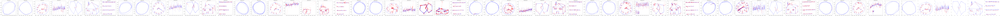

VAE model saved for epoch 20 at vae_models\epoch_20_model.h5.


Epoch 21/100: 100%|██████████| 203/203 [00:03<00:00, 51.00batch/s, Generator Loss=0.000545, Reconstruction Loss=0.000235, KL Loss=1.55]


Epoch 21: Generator Loss = 0.000629, Reconstruction Loss = 0.000325, KL Divergence Loss = 1.519057


Epoch 22/100: 100%|██████████| 203/203 [00:03<00:00, 56.92batch/s, Generator Loss=0.000604, Reconstruction Loss=0.000303, KL Loss=1.51]


Epoch 22: Generator Loss = 0.000654, Reconstruction Loss = 0.000360, KL Divergence Loss = 1.472985


Epoch 23/100: 100%|██████████| 203/203 [00:03<00:00, 58.85batch/s, Generator Loss=0.000703, Reconstruction Loss=0.00041, KL Loss=1.47] 


Epoch 23: Generator Loss = 0.000615, Reconstruction Loss = 0.000327, KL Divergence Loss = 1.443159


Epoch 24/100: 100%|██████████| 203/203 [00:03<00:00, 56.90batch/s, Generator Loss=0.000609, Reconstruction Loss=0.000323, KL Loss=1.43]


Epoch 24: Generator Loss = 0.000614, Reconstruction Loss = 0.000333, KL Divergence Loss = 1.405616


Epoch 25/100: 100%|██████████| 203/203 [00:03<00:00, 57.85batch/s, Generator Loss=0.000493, Reconstruction Loss=0.000213, KL Loss=1.4] 


Epoch 25: Generator Loss = 0.000563, Reconstruction Loss = 0.000287, KL Divergence Loss = 1.377625


Epoch 26/100: 100%|██████████| 203/203 [00:03<00:00, 57.43batch/s, Generator Loss=0.000487, Reconstruction Loss=0.000217, KL Loss=1.35]


Epoch 26: Generator Loss = 0.000556, Reconstruction Loss = 0.000288, KL Divergence Loss = 1.339234


Epoch 27/100: 100%|██████████| 203/203 [00:03<00:00, 59.36batch/s, Generator Loss=0.000462, Reconstruction Loss=0.000199, KL Loss=1.32]


Epoch 27: Generator Loss = 0.000565, Reconstruction Loss = 0.000305, KL Divergence Loss = 1.298525


Epoch 28/100: 100%|██████████| 203/203 [00:03<00:00, 57.70batch/s, Generator Loss=0.000453, Reconstruction Loss=0.000199, KL Loss=1.27]


Epoch 28: Generator Loss = 0.000584, Reconstruction Loss = 0.000332, KL Divergence Loss = 1.262458


Epoch 29/100: 100%|██████████| 203/203 [00:03<00:00, 58.79batch/s, Generator Loss=0.000446, Reconstruction Loss=0.000199, KL Loss=1.24]


Epoch 29: Generator Loss = 0.000525, Reconstruction Loss = 0.000279, KL Divergence Loss = 1.228215


Epoch 30/100: 100%|██████████| 203/203 [00:03<00:00, 55.99batch/s, Generator Loss=0.000406, Reconstruction Loss=0.000168, KL Loss=1.19]


Epoch 30: Generator Loss = 0.000503, Reconstruction Loss = 0.000265, KL Divergence Loss = 1.190872


Epoch 31/100: 100%|██████████| 203/203 [00:03<00:00, 57.97batch/s, Generator Loss=0.000526, Reconstruction Loss=0.000293, KL Loss=1.17]


Epoch 31: Generator Loss = 0.000527, Reconstruction Loss = 0.000296, KL Divergence Loss = 1.156920


Epoch 32/100: 100%|██████████| 203/203 [00:03<00:00, 54.26batch/s, Generator Loss=0.000358, Reconstruction Loss=0.000132, KL Loss=1.13]


Epoch 32: Generator Loss = 0.000448, Reconstruction Loss = 0.000222, KL Divergence Loss = 1.131859


Epoch 33/100: 100%|██████████| 203/203 [00:03<00:00, 57.86batch/s, Generator Loss=0.000568, Reconstruction Loss=0.000353, KL Loss=1.08]


Epoch 33: Generator Loss = 0.000491, Reconstruction Loss = 0.000273, KL Divergence Loss = 1.092081


Epoch 34/100: 100%|██████████| 203/203 [00:03<00:00, 54.26batch/s, Generator Loss=0.000359, Reconstruction Loss=0.000145, KL Loss=1.07] 


Epoch 34: Generator Loss = 0.000482, Reconstruction Loss = 0.000268, KL Divergence Loss = 1.065715


Epoch 35/100: 100%|██████████| 203/203 [00:03<00:00, 54.39batch/s, Generator Loss=0.000326, Reconstruction Loss=0.00012, KL Loss=1.03]  


Epoch 35: Generator Loss = 0.000432, Reconstruction Loss = 0.000224, KL Divergence Loss = 1.037521


Epoch 36/100: 100%|██████████| 203/203 [00:03<00:00, 53.07batch/s, Generator Loss=0.000441, Reconstruction Loss=0.000243, KL Loss=0.995]


Epoch 36: Generator Loss = 0.000453, Reconstruction Loss = 0.000252, KL Divergence Loss = 1.007514


Epoch 37/100: 100%|██████████| 203/203 [00:04<00:00, 50.24batch/s, Generator Loss=0.00034, Reconstruction Loss=0.000145, KL Loss=0.974] 


Epoch 37: Generator Loss = 0.000455, Reconstruction Loss = 0.000259, KL Divergence Loss = 0.981368


Epoch 38/100: 100%|██████████| 203/203 [00:03<00:00, 52.84batch/s, Generator Loss=0.000314, Reconstruction Loss=0.000124, KL Loss=0.947]


Epoch 38: Generator Loss = 0.000383, Reconstruction Loss = 0.000191, KL Divergence Loss = 0.960896


Epoch 39/100: 100%|██████████| 203/203 [00:03<00:00, 50.86batch/s, Generator Loss=0.000342, Reconstruction Loss=0.000158, KL Loss=0.919]


Epoch 39: Generator Loss = 0.000427, Reconstruction Loss = 0.000239, KL Divergence Loss = 0.936456


Epoch 40/100: 100%|██████████| 203/203 [00:03<00:00, 52.16batch/s, Generator Loss=0.000435, Reconstruction Loss=0.000254, KL Loss=0.904]


Epoch 40: Generator Loss = 0.000406, Reconstruction Loss = 0.000224, KL Divergence Loss = 0.914594


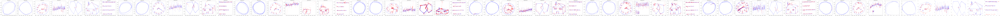

VAE model saved for epoch 40 at vae_models\epoch_40_model.h5.


Epoch 41/100: 100%|██████████| 203/203 [00:04<00:00, 49.59batch/s, Generator Loss=0.000327, Reconstruction Loss=0.00015, KL Loss=0.885] 


Epoch 41: Generator Loss = 0.000393, Reconstruction Loss = 0.000214, KL Divergence Loss = 0.894431


Epoch 42/100: 100%|██████████| 203/203 [00:03<00:00, 51.75batch/s, Generator Loss=0.000298, Reconstruction Loss=0.000126, KL Loss=0.86] 


Epoch 42: Generator Loss = 0.000391, Reconstruction Loss = 0.000216, KL Divergence Loss = 0.872620


Epoch 43/100: 100%|██████████| 203/203 [00:03<00:00, 54.88batch/s, Generator Loss=0.000272, Reconstruction Loss=0.000104, KL Loss=0.843]


Epoch 43: Generator Loss = 0.000361, Reconstruction Loss = 0.000189, KL Divergence Loss = 0.857280


Epoch 44/100: 100%|██████████| 203/203 [00:03<00:00, 53.76batch/s, Generator Loss=0.000278, Reconstruction Loss=0.00011, KL Loss=0.841] 


Epoch 44: Generator Loss = 0.000407, Reconstruction Loss = 0.000239, KL Divergence Loss = 0.842033


Epoch 45/100: 100%|██████████| 203/203 [00:03<00:00, 53.71batch/s, Generator Loss=0.000286, Reconstruction Loss=0.000124, KL Loss=0.811]


Epoch 45: Generator Loss = 0.000329, Reconstruction Loss = 0.000165, KL Divergence Loss = 0.823768


Epoch 46/100: 100%|██████████| 203/203 [00:03<00:00, 54.23batch/s, Generator Loss=0.00028, Reconstruction Loss=0.00012, KL Loss=0.799]  


Epoch 46: Generator Loss = 0.000400, Reconstruction Loss = 0.000239, KL Divergence Loss = 0.803818


Epoch 47/100: 100%|██████████| 203/203 [00:03<00:00, 52.66batch/s, Generator Loss=0.000249, Reconstruction Loss=9.26e-5, KL Loss=0.783] 


Epoch 47: Generator Loss = 0.000349, Reconstruction Loss = 0.000192, KL Divergence Loss = 0.785363


Epoch 48/100: 100%|██████████| 203/203 [00:03<00:00, 51.04batch/s, Generator Loss=0.000255, Reconstruction Loss=0.000102, KL Loss=0.761]


Epoch 48: Generator Loss = 0.000305, Reconstruction Loss = 0.000151, KL Divergence Loss = 0.771037


Epoch 49/100: 100%|██████████| 203/203 [00:03<00:00, 51.42batch/s, Generator Loss=0.000291, Reconstruction Loss=0.000141, KL Loss=0.751]


Epoch 49: Generator Loss = 0.000319, Reconstruction Loss = 0.000168, KL Divergence Loss = 0.756916


Epoch 50/100: 100%|██████████| 203/203 [00:03<00:00, 54.00batch/s, Generator Loss=0.000255, Reconstruction Loss=0.000109, KL Loss=0.734]


Epoch 50: Generator Loss = 0.000305, Reconstruction Loss = 0.000156, KL Divergence Loss = 0.743464


Epoch 51/100: 100%|██████████| 203/203 [00:03<00:00, 51.32batch/s, Generator Loss=0.000295, Reconstruction Loss=0.000151, KL Loss=0.721]


Epoch 51: Generator Loss = 0.000303, Reconstruction Loss = 0.000157, KL Divergence Loss = 0.727947


Epoch 52/100: 100%|██████████| 203/203 [00:03<00:00, 51.29batch/s, Generator Loss=0.000281, Reconstruction Loss=0.00014, KL Loss=0.705] 


Epoch 52: Generator Loss = 0.000311, Reconstruction Loss = 0.000168, KL Divergence Loss = 0.717144


Epoch 53/100: 100%|██████████| 203/203 [00:03<00:00, 52.71batch/s, Generator Loss=0.000266, Reconstruction Loss=0.000127, KL Loss=0.699]


Epoch 53: Generator Loss = 0.000329, Reconstruction Loss = 0.000188, KL Divergence Loss = 0.709461


Epoch 54/100: 100%|██████████| 203/203 [00:03<00:00, 53.53batch/s, Generator Loss=0.000231, Reconstruction Loss=9.39e-5, KL Loss=0.685] 


Epoch 54: Generator Loss = 0.000308, Reconstruction Loss = 0.000169, KL Divergence Loss = 0.692513


Epoch 55/100: 100%|██████████| 203/203 [00:03<00:00, 54.06batch/s, Generator Loss=0.000352, Reconstruction Loss=0.000217, KL Loss=0.671]


Epoch 55: Generator Loss = 0.000270, Reconstruction Loss = 0.000134, KL Divergence Loss = 0.680625


Epoch 56/100: 100%|██████████| 203/203 [00:03<00:00, 51.58batch/s, Generator Loss=0.000321, Reconstruction Loss=0.00019, KL Loss=0.655] 


Epoch 56: Generator Loss = 0.000317, Reconstruction Loss = 0.000184, KL Divergence Loss = 0.665755


Epoch 57/100: 100%|██████████| 203/203 [00:04<00:00, 49.54batch/s, Generator Loss=0.000232, Reconstruction Loss=0.000102, KL Loss=0.653]


Epoch 57: Generator Loss = 0.000289, Reconstruction Loss = 0.000158, KL Divergence Loss = 0.656099


Epoch 58/100: 100%|██████████| 203/203 [00:03<00:00, 53.55batch/s, Generator Loss=0.00021, Reconstruction Loss=8.32e-5, KL Loss=0.636]  


Epoch 58: Generator Loss = 0.000262, Reconstruction Loss = 0.000132, KL Divergence Loss = 0.645632


Epoch 59/100: 100%|██████████| 203/203 [00:03<00:00, 53.27batch/s, Generator Loss=0.000224, Reconstruction Loss=9.84e-5, KL Loss=0.626] 


Epoch 59: Generator Loss = 0.000256, Reconstruction Loss = 0.000130, KL Divergence Loss = 0.630687


Epoch 60/100: 100%|██████████| 203/203 [00:03<00:00, 53.62batch/s, Generator Loss=0.000227, Reconstruction Loss=0.000104, KL Loss=0.616]


Epoch 60: Generator Loss = 0.000255, Reconstruction Loss = 0.000131, KL Divergence Loss = 0.620684


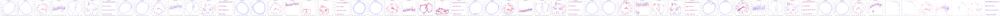

VAE model saved for epoch 60 at vae_models\epoch_60_model.h5.


Epoch 61/100: 100%|██████████| 203/203 [00:04<00:00, 48.57batch/s, Generator Loss=0.000216, Reconstruction Loss=9.49e-5, KL Loss=0.603] 


Epoch 61: Generator Loss = 0.000243, Reconstruction Loss = 0.000120, KL Divergence Loss = 0.612876


Epoch 62/100: 100%|██████████| 203/203 [00:03<00:00, 52.09batch/s, Generator Loss=0.000296, Reconstruction Loss=0.000177, KL Loss=0.595]


Epoch 62: Generator Loss = 0.000281, Reconstruction Loss = 0.000161, KL Divergence Loss = 0.604272


Epoch 63/100: 100%|██████████| 203/203 [00:03<00:00, 53.13batch/s, Generator Loss=0.000231, Reconstruction Loss=0.000114, KL Loss=0.587]


Epoch 63: Generator Loss = 0.000250, Reconstruction Loss = 0.000132, KL Divergence Loss = 0.592161


Epoch 64/100: 100%|██████████| 203/203 [00:04<00:00, 50.69batch/s, Generator Loss=0.000198, Reconstruction Loss=8.28e-5, KL Loss=0.577] 


Epoch 64: Generator Loss = 0.000234, Reconstruction Loss = 0.000118, KL Divergence Loss = 0.583439


Epoch 65/100: 100%|██████████| 203/203 [00:03<00:00, 52.96batch/s, Generator Loss=0.000169, Reconstruction Loss=5.57e-5, KL Loss=0.566] 


Epoch 65: Generator Loss = 0.000218, Reconstruction Loss = 0.000104, KL Divergence Loss = 0.571999


Epoch 66/100: 100%|██████████| 203/203 [00:04<00:00, 48.41batch/s, Generator Loss=0.000219, Reconstruction Loss=0.000107, KL Loss=0.562]


Epoch 66: Generator Loss = 0.000227, Reconstruction Loss = 0.000114, KL Divergence Loss = 0.563694


Epoch 67/100: 100%|██████████| 203/203 [00:03<00:00, 52.34batch/s, Generator Loss=0.000308, Reconstruction Loss=0.000197, KL Loss=0.554]


Epoch 67: Generator Loss = 0.000255, Reconstruction Loss = 0.000142, KL Divergence Loss = 0.565089


Epoch 68/100: 100%|██████████| 203/203 [00:04<00:00, 50.43batch/s, Generator Loss=0.000204, Reconstruction Loss=9.46e-5, KL Loss=0.545] 


Epoch 68: Generator Loss = 0.000225, Reconstruction Loss = 0.000115, KL Divergence Loss = 0.550557


Epoch 69/100: 100%|██████████| 203/203 [00:04<00:00, 49.81batch/s, Generator Loss=0.000245, Reconstruction Loss=0.000137, KL Loss=0.539]


Epoch 69: Generator Loss = 0.000261, Reconstruction Loss = 0.000152, KL Divergence Loss = 0.546498


Epoch 70/100: 100%|██████████| 203/203 [00:04<00:00, 47.96batch/s, Generator Loss=0.000248, Reconstruction Loss=0.000141, KL Loss=0.535]


Epoch 70: Generator Loss = 0.000254, Reconstruction Loss = 0.000146, KL Divergence Loss = 0.538406


Epoch 71/100: 100%|██████████| 203/203 [00:04<00:00, 44.82batch/s, Generator Loss=0.000204, Reconstruction Loss=9.89e-5, KL Loss=0.527] 


Epoch 71: Generator Loss = 0.000207, Reconstruction Loss = 0.000101, KL Divergence Loss = 0.530979


Epoch 72/100: 100%|██████████| 203/203 [00:04<00:00, 41.84batch/s, Generator Loss=0.000198, Reconstruction Loss=9.41e-5, KL Loss=0.519] 


Epoch 72: Generator Loss = 0.000184, Reconstruction Loss = 0.000080, KL Divergence Loss = 0.523321


Epoch 73/100: 100%|██████████| 203/203 [00:05<00:00, 38.43batch/s, Generator Loss=0.000192, Reconstruction Loss=8.92e-5, KL Loss=0.515] 


Epoch 73: Generator Loss = 0.000207, Reconstruction Loss = 0.000103, KL Divergence Loss = 0.516463


Epoch 74/100: 100%|██████████| 203/203 [00:05<00:00, 34.73batch/s, Generator Loss=0.000265, Reconstruction Loss=0.000163, KL Loss=0.508]


Epoch 74: Generator Loss = 0.000211, Reconstruction Loss = 0.000109, KL Divergence Loss = 0.511612


Epoch 75/100: 100%|██████████| 203/203 [00:04<00:00, 44.79batch/s, Generator Loss=0.000219, Reconstruction Loss=0.000118, KL Loss=0.51] 


Epoch 75: Generator Loss = 0.000264, Reconstruction Loss = 0.000162, KL Divergence Loss = 0.510874


Epoch 76/100: 100%|██████████| 203/203 [00:04<00:00, 46.25batch/s, Generator Loss=0.000189, Reconstruction Loss=8.95e-5, KL Loss=0.498] 


Epoch 76: Generator Loss = 0.000191, Reconstruction Loss = 0.000091, KL Divergence Loss = 0.500206


Epoch 77/100: 100%|██████████| 203/203 [00:04<00:00, 47.92batch/s, Generator Loss=0.000164, Reconstruction Loss=6.46e-5, KL Loss=0.499] 


Epoch 77: Generator Loss = 0.000225, Reconstruction Loss = 0.000124, KL Divergence Loss = 0.504566


Epoch 78/100: 100%|██████████| 203/203 [00:03<00:00, 51.79batch/s, Generator Loss=0.000163, Reconstruction Loss=6.56e-5, KL Loss=0.486] 


Epoch 78: Generator Loss = 0.000176, Reconstruction Loss = 0.000078, KL Divergence Loss = 0.489431


Epoch 79/100: 100%|██████████| 203/203 [00:03<00:00, 53.95batch/s, Generator Loss=0.000154, Reconstruction Loss=5.49e-5, KL Loss=0.497] 


Epoch 79: Generator Loss = 0.000279, Reconstruction Loss = 0.000177, KL Divergence Loss = 0.511328


Epoch 80/100: 100%|██████████| 203/203 [00:03<00:00, 54.01batch/s, Generator Loss=0.000155, Reconstruction Loss=5.8e-5, KL Loss=0.484]  


Epoch 80: Generator Loss = 0.000180, Reconstruction Loss = 0.000083, KL Divergence Loss = 0.486408


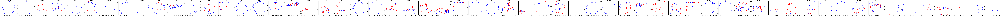

VAE model saved for epoch 80 at vae_models\epoch_80_model.h5.


Epoch 81/100: 100%|██████████| 203/203 [00:03<00:00, 50.87batch/s, Generator Loss=0.000171, Reconstruction Loss=7.61e-5, KL Loss=0.476] 


Epoch 81: Generator Loss = 0.000176, Reconstruction Loss = 0.000081, KL Divergence Loss = 0.475477


Epoch 82/100: 100%|██████████| 203/203 [00:03<00:00, 53.27batch/s, Generator Loss=0.000211, Reconstruction Loss=0.000117, KL Loss=0.47] 


Epoch 82: Generator Loss = 0.000187, Reconstruction Loss = 0.000092, KL Divergence Loss = 0.472376


Epoch 83/100: 100%|██████████| 203/203 [00:03<00:00, 53.25batch/s, Generator Loss=0.000166, Reconstruction Loss=7.31e-5, KL Loss=0.465] 


Epoch 83: Generator Loss = 0.000211, Reconstruction Loss = 0.000117, KL Divergence Loss = 0.467621


Epoch 84/100: 100%|██████████| 203/203 [00:03<00:00, 52.26batch/s, Generator Loss=0.000166, Reconstruction Loss=7.27e-5, KL Loss=0.464] 


Epoch 84: Generator Loss = 0.000192, Reconstruction Loss = 0.000099, KL Divergence Loss = 0.464285


Epoch 85/100: 100%|██████████| 203/203 [00:04<00:00, 50.69batch/s, Generator Loss=0.000154, Reconstruction Loss=6.18e-5, KL Loss=0.459] 


Epoch 85: Generator Loss = 0.000173, Reconstruction Loss = 0.000081, KL Divergence Loss = 0.459222


Epoch 86/100: 100%|██████████| 203/203 [00:04<00:00, 49.87batch/s, Generator Loss=0.000148, Reconstruction Loss=5.69e-5, KL Loss=0.453] 


Epoch 86: Generator Loss = 0.000171, Reconstruction Loss = 0.000080, KL Divergence Loss = 0.454847


Epoch 87/100: 100%|██████████| 203/203 [00:04<00:00, 50.57batch/s, Generator Loss=0.000177, Reconstruction Loss=8.61e-5, KL Loss=0.456] 


Epoch 87: Generator Loss = 0.000193, Reconstruction Loss = 0.000103, KL Divergence Loss = 0.450615


Epoch 88/100: 100%|██████████| 203/203 [00:03<00:00, 53.71batch/s, Generator Loss=0.000149, Reconstruction Loss=5.89e-5, KL Loss=0.448] 


Epoch 88: Generator Loss = 0.000189, Reconstruction Loss = 0.000099, KL Divergence Loss = 0.449112


Epoch 89/100: 100%|██████████| 203/203 [00:03<00:00, 54.59batch/s, Generator Loss=0.000276, Reconstruction Loss=0.000188, KL Loss=0.44] 


Epoch 89: Generator Loss = 0.000166, Reconstruction Loss = 0.000078, KL Divergence Loss = 0.443859


Epoch 90/100: 100%|██████████| 203/203 [00:03<00:00, 52.63batch/s, Generator Loss=0.000178, Reconstruction Loss=8.68e-5, KL Loss=0.455] 


Epoch 90: Generator Loss = 0.000226, Reconstruction Loss = 0.000131, KL Divergence Loss = 0.475277


Epoch 91/100: 100%|██████████| 203/203 [00:03<00:00, 53.71batch/s, Generator Loss=0.000196, Reconstruction Loss=0.000108, KL Loss=0.44] 


Epoch 91: Generator Loss = 0.000197, Reconstruction Loss = 0.000107, KL Divergence Loss = 0.447972


Epoch 92/100: 100%|██████████| 203/203 [00:03<00:00, 53.96batch/s, Generator Loss=0.000175, Reconstruction Loss=8.81e-5, KL Loss=0.437] 


Epoch 92: Generator Loss = 0.000174, Reconstruction Loss = 0.000087, KL Divergence Loss = 0.436815


Epoch 93/100: 100%|██████████| 203/203 [00:03<00:00, 53.34batch/s, Generator Loss=0.000174, Reconstruction Loss=8.8e-5, KL Loss=0.428]  


Epoch 93: Generator Loss = 0.000163, Reconstruction Loss = 0.000076, KL Divergence Loss = 0.431531


Epoch 94/100: 100%|██████████| 203/203 [00:03<00:00, 51.93batch/s, Generator Loss=0.00014, Reconstruction Loss=5.48e-5, KL Loss=0.426]  


Epoch 94: Generator Loss = 0.000164, Reconstruction Loss = 0.000079, KL Divergence Loss = 0.428068


Epoch 95/100: 100%|██████████| 203/203 [00:03<00:00, 54.09batch/s, Generator Loss=0.000187, Reconstruction Loss=0.000102, KL Loss=0.428]


Epoch 95: Generator Loss = 0.000191, Reconstruction Loss = 0.000104, KL Divergence Loss = 0.432328


Epoch 96/100: 100%|██████████| 203/203 [00:03<00:00, 53.49batch/s, Generator Loss=0.000176, Reconstruction Loss=9.17e-5, KL Loss=0.423] 


Epoch 96: Generator Loss = 0.000167, Reconstruction Loss = 0.000083, KL Divergence Loss = 0.421996


Epoch 97/100: 100%|██████████| 203/203 [00:03<00:00, 53.74batch/s, Generator Loss=0.000199, Reconstruction Loss=0.000115, KL Loss=0.421]


Epoch 97: Generator Loss = 0.000176, Reconstruction Loss = 0.000091, KL Divergence Loss = 0.420857


Epoch 98/100: 100%|██████████| 203/203 [00:03<00:00, 53.93batch/s, Generator Loss=0.000131, Reconstruction Loss=4.52e-5, KL Loss=0.427] 


Epoch 98: Generator Loss = 0.000272, Reconstruction Loss = 0.000183, KL Divergence Loss = 0.445956


Epoch 99/100: 100%|██████████| 203/203 [00:03<00:00, 52.48batch/s, Generator Loss=0.000169, Reconstruction Loss=8.65e-5, KL Loss=0.412] 


Epoch 99: Generator Loss = 0.000146, Reconstruction Loss = 0.000062, KL Divergence Loss = 0.418614


Epoch 100/100: 100%|██████████| 203/203 [00:03<00:00, 51.83batch/s, Generator Loss=0.000185, Reconstruction Loss=0.000103, KL Loss=0.41] 


Epoch 100: Generator Loss = 0.000156, Reconstruction Loss = 0.000074, KL Divergence Loss = 0.412181


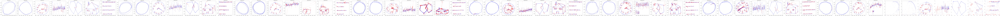

VAE model saved for epoch 100 at vae_models\epoch_100_model.h5.
Final VAE model saved.


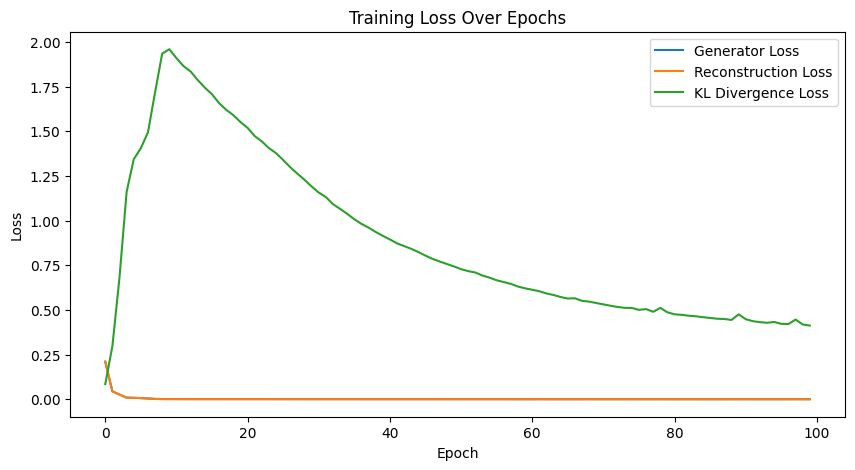

<Figure size 640x480 with 0 Axes>

In [14]:
#Cell 8
@tf.function
def train_vae_step(model, x, optimizer, lstm_discriminator=None):
    with tf.GradientTape() as tape:
        x_reconstructed, mean, logvar = model(x)
        reconstruction_loss, kl_loss, total_kl_loss = compute_loss(model, x)
        
        if lstm_discriminator is not None:
            real_predictions = lstm_discriminator(tf.expand_dims(x, axis=0))
            fake_predictions = lstm_discriminator(tf.expand_dims(x_reconstructed, axis=0))
            discriminator_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_predictions), real_predictions) +
                                                tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_predictions), fake_predictions))
            generator_loss = reconstruction_loss + 0.0002 * total_kl_loss + 0.1 * discriminator_loss
        else:
            generator_loss = reconstruction_loss + 0.0002 * total_kl_loss
    
    gradients = tape.gradient(generator_loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return generator_loss, reconstruction_loss, kl_loss

@tf.function
def train_lstm_step(lstm_model, real_data, generated_data, optimizer):
    with tf.GradientTape() as tape:
        real_predictions = lstm_model(real_data)
        generated_predictions = lstm_model(generated_data)
        real_loss = tf.keras.losses.binary_crossentropy(tf.ones_like(real_predictions), real_predictions)
        generated_loss = tf.keras.losses.binary_crossentropy(tf.zeros_like(generated_predictions), generated_predictions)
        total_loss = real_loss + generated_loss
    gradients = tape.gradient(total_loss, lstm_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, lstm_model.trainable_variables))
    return total_loss

# Initialize LSTM discriminator and optimizer
lstm_discriminator = LSTMDiscriminator()
lstm_optimizer = tf.keras.optimizers.Adam(learning_rate)

batch_size = 1024
train_datasets = [tf.data.Dataset.from_tensor_slices(data).shuffle(10000).batch(batch_size) for data in processed_data]

# Set up alternating epochs
vae_epochs = 100
lstm_interval = 10
epochs = 100
visual_per_num_epoch = 20
num_augmented_files = 7

generator_loss_history = []
reconstruction_loss_history = []
kl_loss_history = []
nrmse_history = []

save_dir = "vae_models"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for epoch in range(epochs):
    generator_loss = 0 
    reconstruction_loss_sum = 0
    kl_loss_sum = 0
    num_batches = sum(len(dataset) for dataset in train_datasets)

    with tqdm(total=num_batches, desc=f'Epoch {epoch+1}/{epochs}', unit='batch') as pbar:
        for dataset in train_datasets:
            for batch in dataset:
                use_lstm = epoch >= vae_epochs and (epoch - vae_epochs) % lstm_interval == 0
                generator_loss_batch, reconstruction_loss, kl_loss = train_vae_step(vae, batch, optimizer, lstm_discriminator if use_lstm else None)
                generator_loss += generator_loss_batch
                reconstruction_loss_sum += reconstruction_loss
                kl_loss_sum += kl_loss
                pbar.update(1)
                pbar.set_postfix({'Generator Loss': float(generator_loss_batch), 'Reconstruction Loss': float(reconstruction_loss), 'KL Loss': float(kl_loss)})

    # Train LSTM every `lstm_interval` epochs after `vae_epochs`
    if epoch >= vae_epochs and (epoch - vae_epochs) % lstm_interval == 0:
        for data in processed_data:
            augmented_data = vae.decode(tf.random.normal(shape=(data.shape[0], latent_dim))).numpy()
            real_data = tf.expand_dims(data, axis=0)
            generated_data = tf.expand_dims(augmented_data, axis=0)
            lstm_loss = train_lstm_step(lstm_discriminator, real_data, generated_data, lstm_optimizer)
        print(f'LSTM training at epoch {epoch+1}: Discriminator Loss = {lstm_loss.numpy()}')


    avg_generator_loss = generator_loss / num_batches  # Update the average calculation
    avg_reconstruction_loss = reconstruction_loss_sum / num_batches
    avg_kl_loss = kl_loss_sum / num_batches

    generator_loss_history.append(avg_generator_loss)  # Update history list
    reconstruction_loss_history.append(avg_reconstruction_loss)
    kl_loss_history.append(avg_kl_loss)



    print(f"Epoch {epoch+1}: Generator Loss = {avg_generator_loss:.6f}, Reconstruction Loss = {avg_reconstruction_loss:.6f}, KL Divergence Loss = {avg_kl_loss:.6f}")



    # Cell 5 (visualization part)
    if (epoch + 1) % visual_per_num_epoch == 0:
        base_latent_variability = 100.0
        latent_variability_range = (0.1, 5.0)

        augmented_datasets = generate_augmented_data(vae, num_augmented_files, avg_data_points, processed_data, 
                                                     base_latent_variability, latent_variability_range)

        # Calculate actual latent variabilities and lengths used
        latent_variabilities = [base_latent_variability * np.random.uniform(latent_variability_range[0], latent_variability_range[1]) for _ in range(num_augmented_files)]
        augmented_lengths = [len(data) for data in augmented_datasets]

        fig, axs = plt.subplots(1, num_augmented_files + len(original_data_frames), figsize=(6*(num_augmented_files + len(original_data_frames)), 6))

        for i, original_data in enumerate(original_data_frames):
            original_on_paper = original_data[original_data['pen_status'] == 1]
            original_in_air = original_data[original_data['pen_status'] == 0]

            axs[i].scatter(original_on_paper['y'], original_on_paper['x'], c='b', s=1, label='On Paper')
            axs[i].scatter(original_in_air['y'], original_in_air['x'], c='r', s=1, label='In Air')
            axs[i].set_title(f'Original Data {i+1}')
            axs[i].invert_xaxis()

        # Set consistent axis limits for square aspect ratio for both original and augmented data
        x_min = min(data[:, 0].min() for data in processed_data)
        x_max = max(data[:, 0].max() for data in processed_data)
        y_min = min(data[:, 1].min() for data in processed_data)
        y_max = max(data[:, 1].max() for data in processed_data)

        for i, (augmented_data, latent_var, length) in enumerate(zip(augmented_datasets, latent_variabilities, augmented_lengths)):
            augmented_on_paper = augmented_data[augmented_data[:, 3] == 1]
            augmented_in_air = augmented_data[augmented_data[:, 3] == 0]

            axs[i+len(original_data_frames)].scatter(augmented_on_paper[:, 1], augmented_on_paper[:, 0], c='b', s=1, label='On Paper')
            axs[i+len(original_data_frames)].scatter(augmented_in_air[:, 1], augmented_in_air[:, 0], c='r', s=1, label='In Air')
            axs[i+len(original_data_frames)].invert_xaxis()
            axs[i+len(original_data_frames)].set_xlim(y_max, y_min)
            axs[i+len(original_data_frames)].set_ylim(x_min, x_max)

        plt.tight_layout()
        plt.show()
        # Save VAE model after each epoch, directly into the `vae_models` folder
        model_save_path = os.path.join(save_dir, f"epoch_{epoch+1}_model.h5")
        vae.save(model_save_path)
        print(f"VAE model saved for epoch {epoch+1} at {model_save_path}.")

# Final output and plots
plt.ioff()
plt.show()

vae.save('pentab_saved_model.h5')
print("Final VAE model saved.")

# Plot generator loss history
plt.figure(figsize=(10, 5))
plt.plot(generator_loss_history, label='Generator Loss')  # Update label
plt.plot(reconstruction_loss_history, label='Reconstruction Loss')
plt.plot(kl_loss_history, label='KL Divergence Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

plt.tight_layout()
plt.show()

c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Pretrained VAE model loaded.
Starting augmentation iteration 1
Augmented data saved to augmented_data\synthetic_u00077s00001_hw00004.svc
Augmented data saved to augmented_data_nested\u00077s00001_hw00004.svc
Shape of augmented data for u00077s00001_hw00004.svc: (1024, 7)
Augmented data saved to augmented_data\synthetic_u00077s00001_hw00005.svc
Augmented data saved to augmented_data_nested\u00077s00001_hw00005.svc
Shape of augmented data for u00077s00001_hw00005.svc: (826, 7)
Augmented data saved to augmented_data\synthetic_u00077s00001_hw00006.svc
Augmented data saved to augmented_data_nested\u00077s00001_hw00006.svc
Shape of augmented data for u00077s00001_hw00006.svc: (3261, 7)
Augmented data saved to augmented_data\synthetic_u00077s00001_hw00007.svc
Augmented data saved to augmented_data_nested\u00077s00001_hw00007.svc
Shape of augmented data for u00077s00001_hw00007.svc: (3241, 7)
Augmented data saved to augmented_data\synthetic_u00078s00001_hw00001.svc
Augmented data saved to augm

C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\4074584232.py:32: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, delim_whitespace=True, header=None)
C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\4074584232.py:32: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, delim_whitespace=True, header=None)
C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\4074584232.py:32: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, delim_whitespace=True, header=None)
C:\Users\Grimes\AppData\Local\Temp\ipykernel_13376\4074584232.py:32: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a 

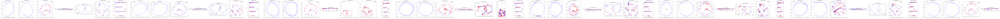

In [15]:
# Cell 9
import shutil

# Base latent variability settings
base_latent_variability = 100.0
latent_variability_range = (0.99, 1.01)
all_augmented_data = []  # Global list to store all augmented data

def repeat_backwards(original_paa, augmented_length):
    repeat_count = augmented_length - len(original_paa)
    if repeat_count <= 0:
        return original_paa
    backwards_rows = np.empty((0, original_paa.shape[1]))
    for i in range(repeat_count):
        row_to_repeat = original_paa[-(i % len(original_paa) + 1)]
        backwards_rows = np.vstack((backwards_rows, row_to_repeat))
    return np.vstack((original_paa, backwards_rows))

def visualize_augmented_data_from_directory(directory):
    augmented_files = [f for f in os.listdir(directory) if f.startswith('synthetic_') and f.endswith('.svc')]
    num_files = len(augmented_files)
    if num_files == 0:
        print("No augmented data files found in the directory.")
        return
    
    fig, axs = plt.subplots(1, num_files, figsize=(6 * num_files, 6), constrained_layout=True)
    if num_files == 1:
        axs = [axs]
    
    for i, filename in enumerate(augmented_files):
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path, delim_whitespace=True, header=None)
        df.columns = ['x', 'y', 'timestamp', 'pen_status', 'pressure', 'azimuth', 'altitude']
        
        on_paper = df[df['pen_status'] == 1]
        in_air = df[df['pen_status'] == 0]

        axs[i].scatter(on_paper['y'], on_paper['x'], c='b', s=1, alpha=0.7, label='On Paper')
        axs[i].scatter(in_air['y'], in_air['x'], c='r', s=1, alpha=0.7, label='In Air')
        axs[i].set_title(f'Augmented Data {i + 1}')
        axs[i].set_xlabel('y')
        axs[i].set_ylabel('x')
        axs[i].invert_xaxis()
        axs[i].set_aspect('equal')
        axs[i].legend()
    
    plt.show()

def get_unique_filename(directory, filename):
    base, extension = os.path.splitext(filename)
    counter = 1
    while os.path.exists(os.path.join(directory, filename)):
        filename = f"{base}({counter}){extension}"
        counter += 1
    return filename

def download_augmented_data_with_modified_timestamp(augmented_datasets, scalers, original_data_frames, original_filenames, directory1='augmented_data', directory2='augmented_data_nested'):
    global all_augmented_data  # Access the global list

    if not os.path.exists(directory1):
        os.makedirs(directory1)
    
    if not os.path.exists(directory2):
        os.makedirs(directory2)

    for i, (augmented_data, scaler, original_df, original_filename) in enumerate(zip(augmented_datasets, scalers, original_data_frames, original_filenames)):
        augmented_xyz = scaler.inverse_transform(augmented_data[:, :3])
        augmented_xyz_int = np.rint(augmented_xyz).astype(int)
        pen_status = augmented_data[:, 3].astype(int)
        original_paa = original_df[['pressure', 'azimuth', 'altitude']].values
        
        if len(augmented_data) > len(original_paa):
            original_paa = repeat_backwards(original_paa, len(augmented_data))
        
        original_paa_int = np.rint(original_paa).astype(int)
        
        new_timestamps = np.zeros(len(augmented_data), dtype=int)
        increment_sequence = [7, 8]
        current_time = 0
        for idx in range(len(augmented_data)):
            new_timestamps[idx] = current_time
            current_time += increment_sequence[idx % 2]

        augmented_xyz_int[:, 2] = new_timestamps

        augmented_data_original_scale = np.column_stack((
            augmented_xyz_int,
            pen_status,
            original_paa_int[:len(augmented_data)]
        ))

        # Use the original filename for nested directory
        nested_filename = original_filename
        nested_file_path = os.path.join(directory2, nested_filename)

        # For augmented_data directory, add 'synthetic_' prefix and handle duplicates
        augmented_filename = f"synthetic_{original_filename}"
        augmented_filename = get_unique_filename(directory1, augmented_filename)
        augmented_file_path = os.path.join(directory1, augmented_filename)

        np.savetxt(augmented_file_path, augmented_data_original_scale, fmt='%d', delimiter=' ')
        np.savetxt(nested_file_path, augmented_data_original_scale, fmt='%d', delimiter=' ')

        # Only store augmented data from the augmented_data directory
        all_augmented_data.append(augmented_data_original_scale)

        print(f"Augmented data saved to {augmented_file_path}")
        print(f"Augmented data saved to {nested_file_path}")
        print(f"Shape of augmented data for {original_filename}: {augmented_data_original_scale.shape}")

def nested_augmentation(num_augmentations, num_files_to_use):
    with custom_object_scope({'VAE': VAE}):
        vae_pretrained = load_model('vae_models/epoch_100_model.h5')
    print("Pretrained VAE model loaded.")

    # Use the existing data for the first iteration
    global data_frames, processed_data, scalers, avg_data_points, input_filenames, original_data_frames

    for iteration in range(num_augmentations):
        print(f"Starting augmentation iteration {iteration + 1}")
        
        if iteration > 0:
            # Only update the data for subsequent iterations
            directory = 'augmented_data_nested'
            data_frames, processed_data, scalers, avg_data_points, input_filenames, original_data_frames = upload_and_process_files(directory, num_files_to_use)
        
        augmented_datasets = generate_augmented_data(vae_pretrained, num_files_to_use, avg_data_points, processed_data, 
                                                     base_latent_variability, latent_variability_range)
        
        # Clear augmented_data_nested directory
        if os.path.exists('augmented_data_nested'):
            shutil.rmtree('augmented_data_nested')
        os.makedirs('augmented_data_nested')
        
        download_augmented_data_with_modified_timestamp(augmented_datasets, scalers, original_data_frames, input_filenames)
        
        print(f"Completed augmentation iteration {iteration + 1}")
    
    # Clear augmented_data_nested directory after the last iteration
    if os.path.exists('augmented_data_nested'):
        shutil.rmtree('augmented_data_nested')
        print("Cleared augmented_data_nested directory after the final iteration.")
    
    print("Nested augmentation process completed.")
    visualize_augmented_data_from_directory('augmented_data')
    

# Set the number of augmentations and files to use
num_augmentations = 1  # Change this to control the number of nested augmentations

# Run the nested augmentation process
nested_augmentation(num_augmentations, num_files_to_use)

In [55]:
# Cell 11 NRMSE
from glob import glob
import re

def read_svc_file(file_path):
    return pd.read_csv(file_path, sep=' ', header=None, 
                       names=['x', 'y', 'timestamp', 'pen_status', 'azimuth', 'pressure', 'altitude'])

def calculate_nrmse(original, predicted):
    if original.shape != predicted.shape:
        raise ValueError("The shapes of the original and predicted datasets must match.")
    mse = np.mean((original - predicted) ** 2)
    rmse = np.sqrt(mse)
    nrmse = rmse / (np.max(original) - np.min(original))
    return nrmse

def get_matching_augmented_files(original_file, augmented_folder):
    base_name = os.path.basename(original_file)
    base_name_without_ext = os.path.splitext(base_name)[0]
    pattern = os.path.join(augmented_folder, f"synthetic_{base_name_without_ext}*.svc")
    matching_files = glob(pattern)
    
    # Sort files based on the number in parentheses, with the base file (no number) first
    def sort_key(filename):
        match = re.search(r'\((\d+)\)', filename)
        return int(match.group(1)) if match else -1
    
    return sorted(matching_files, key=sort_key)

def process_files(imputed_folder, augmented_folder, input_filenames):
    nrmse_results = {}

    # Create a set of base filenames (without extensions) for easy comparison
    input_filenames_set = {os.path.splitext(os.path.basename(filename))[0] for filename in input_filenames}

    for original_file in glob(os.path.join(imputed_folder, "*.svc")):
        base_name = os.path.splitext(os.path.basename(original_file))[0]
        
        # Only process files that are present in input_filenames
        if base_name not in input_filenames_set:
            continue
        
        file_name = os.path.basename(original_file)
        original_data = read_svc_file(original_file)
        
        matching_augmented_files = get_matching_augmented_files(original_file, augmented_folder)
        
        file_nrmse = []
        for augmented_file in matching_augmented_files:
            augmented_data = read_svc_file(augmented_file)
            
            # Trim to the shorter length
            min_length = min(len(original_data), len(augmented_data))
            original_array = original_data.iloc[:min_length].values
            augmented_array = augmented_data.iloc[:min_length].values
            
            nrmse = calculate_nrmse(original_array, augmented_array)
            file_nrmse.append(nrmse)
        
        nrmse_results[file_name] = file_nrmse

    return nrmse_results

# Define the folders directly in the notebook cell
imputed_folder = "original_absolute"
augmented_folder = "augmented_data"

# Process the files and calculate NRMSE
results = process_files(imputed_folder, augmented_folder, input_filenames)

# Display the results
for original_file, nrmse_values in results.items():
    print(f"Results for {original_file}:")
    for i, nrmse in enumerate(nrmse_values):
        augmented_version = f"({i})" if i > 0 else "base"
        print(f"  NRMSE for augmented version {augmented_version}: {nrmse:.4f}")
    
    if nrmse_values:
        avg_nrmse = np.mean(nrmse_values)
        print(f"  Average NRMSE: {avg_nrmse:.4f}")
    print()

# Calculate and display the overall average NRMSE
all_nrmse = [nrmse for nrmse_list in results.values() for nrmse in nrmse_list]
overall_avg_nrmse = np.mean(all_nrmse)
print(f"Overall Average NRMSE: {overall_avg_nrmse:.4f}")

Results for collection1u00043s00001_hw00007.svc:
  NRMSE for augmented version base: 0.0846
  Average NRMSE: 0.0846

Results for collection1u00044s00001_hw00001.svc:
  NRMSE for augmented version base: 0.0233
  Average NRMSE: 0.0233

Results for collection1u00044s00001_hw00002.svc:
  NRMSE for augmented version base: 0.0321
  Average NRMSE: 0.0321

Results for collection1u00044s00001_hw00003.svc:
  NRMSE for augmented version base: 0.0711
  Average NRMSE: 0.0711

Results for collection1u00044s00001_hw00004.svc:
  NRMSE for augmented version base: 0.0121
  Average NRMSE: 0.0121

Results for collection1u00044s00001_hw00005.svc:
  NRMSE for augmented version base: 0.0078
  Average NRMSE: 0.0078

Results for collection1u00044s00001_hw00006.svc:
  NRMSE for augmented version base: 0.0406
  Average NRMSE: 0.0406

Results for collection1u00044s00001_hw00007.svc:
  NRMSE for augmented version base: 0.0784
  Average NRMSE: 0.0784

Results for collection1u00045s00001_hw00001.svc:
  NRMSE for aug

In [56]:
# Cell 12 Post-Hoc Discriminative Score
def process_files(imputed_folder, augmented_folder, input_filenames):
    all_real_data = []
    all_synthetic_data = []

    # Create a set of base filenames (without extensions) for easy comparison
    input_filenames_set = {os.path.splitext(os.path.basename(filename))[0] for filename in input_filenames}

    for original_file in glob(os.path.join(imputed_folder, "*.svc")):
        base_name = os.path.splitext(os.path.basename(original_file))[0]
        
        # Only process files that are present in input_filenames
        if base_name not in input_filenames_set:
            continue
        
        original_data = read_svc_file(original_file)
        all_real_data.append(original_data.values)
        
        matching_augmented_files = get_matching_augmented_files(original_file, augmented_folder)
        
        for augmented_file in matching_augmented_files:
            augmented_data = read_svc_file(augmented_file)
            all_synthetic_data.append(augmented_data.values)

    return np.concatenate(all_real_data), np.concatenate(all_synthetic_data)

def create_lstm_classifier(input_shape):
    model = Sequential([
        LSTM(16, input_shape=input_shape, return_sequences=True),
        LSTM(8),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

def prepare_data_for_lstm(real_data, synthetic_data):
    n_features = min(real_data.shape[1], synthetic_data.shape[1])
    real_data_trimmed = real_data[:, :n_features]
    synthetic_data_trimmed = synthetic_data[:, :n_features]
    
    X = np.vstack((real_data_trimmed, synthetic_data_trimmed))
    y = np.concatenate((np.ones(len(real_data)), np.zeros(len(synthetic_data))))
    return X, y

def post_hoc_discriminative_score(real_data, synthetic_data, n_splits=10):
    X, y = prepare_data_for_lstm(real_data, synthetic_data)
    
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    accuracies = []
    
    for fold, (train_index, test_index) in enumerate(kf.split(X)):
        print(f"\nFold {fold + 1}/{n_splits}:")  # New print statement for fold numbers
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

        model = create_lstm_classifier((1, X_train.shape[2]))
        
        # Train model and show epoch progress for this fold
        history = model.fit(X_train, y_train, epochs=2, batch_size=1024, verbose=1)

        y_pred = (model.predict(X_test) > 0.5).astype(int)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

    mean_accuracy = np.mean(accuracies)
    std_accuracy = np.std(accuracies)
    return mean_accuracy, std_accuracy

# Specify your folders
imputed_folder = "original_absolute"
augmented_folder = "augmented_data"

# Process files, without NRMSE
real_data, synthetic_data = process_files(imputed_folder, augmented_folder, input_filenames)

# Compute post-hoc discriminative score
mean_accuracy, std_accuracy = post_hoc_discriminative_score(real_data, synthetic_data)

print(f"Mean accuracy: {mean_accuracy:.4f} (±{std_accuracy:.4f})")


Fold 1/10:


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 20s 14ms/step - accuracy: 0.5118 - loss: 0.6917
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.5248 - loss: 0.6895
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step

Fold 2/10:


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - accuracy: 0.5109 - loss: 0.6925
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.5220 - loss: 0.6892
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step

Fold 3/10:


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - accuracy: 0.5087 - loss: 0.6929
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.5209 - loss: 0.6909
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step

Fold 4/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 14s 12ms/step - accuracy: 0.5110 - loss: 0.6924
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.5248 - loss: 0.6911
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step

Fold 5/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 14s 11ms/step - accuracy: 0.5127 - loss: 0.6924
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.5285 - loss: 0.6895
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step

Fold 6/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - accuracy: 0.5042 - loss: 0.6928
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.5180 - loss: 0.6908
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step

Fold 7/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - accuracy: 0.5104 - loss: 0.6923
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.5221 - loss: 0.6900
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step

Fold 8/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 13s 12ms/step - accuracy: 0.5178 - loss: 0.6916
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.5264 - loss: 0.6894
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step

Fold 9/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - accuracy: 0.5203 - loss: 0.6921
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.5235 - loss: 0.6906
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step

Fold 10/10:
Epoch 1/2


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


629/629 ━━━━━━━━━━━━━━━━━━━━ 13s 14ms/step - accuracy: 0.5161 - loss: 0.6921
Epoch 2/2
629/629 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.5263 - loss: 0.6907
2235/2235 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
Mean accuracy: 0.5230 (±0.0053)


In [41]:
# Cell 13 Post Hoc Predictive Score
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import KFold
from keras.callbacks import Callback
from tqdm import tqdm

# Step 1: Prepare Data
def prepare_data(df, time_steps=5):
    data = df[['x', 'y']].values
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_scaled = scaler.fit_transform(data)
    
    # Create sequences of length `time_steps`
    X, y = [], []
    for i in range(len(data_scaled) - time_steps):
        X.append(data_scaled[i:i+time_steps])
        y.append(data_scaled[i+time_steps])
    
    return np.array(X), np.array(y), scaler

# Example usage
X, y, scaler = prepare_data(data_frames[0])

# Custom callback for progress bar
class CustomCallback(Callback):
    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']
        self.progress_bar = tqdm(total=self.epochs, desc="Training Progress")

    def on_epoch_end(self, epoch, logs=None):
        self.progress_bar.update(1)

    def on_train_end(self, logs=None):
        self.progress_bar.close()

# Step 2: Define the LSTM Model
def create_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.2))  # Adding dropout to introduce randomness
    model.add(LSTM(50))
    model.add(Dropout(0.2))
    model.add(Dense(2))  # Predict x and y
    model.compile(optimizer='adam', loss='mse')
    return model

# Step 3: Evaluate Model Function
def evaluate_model(model, X_test, y_test, scaler):
    # Predict and inverse transform
    y_pred = model.predict(X_test)
    y_pred_rescaled = scaler.inverse_transform(y_pred)
    y_test_rescaled = scaler.inverse_transform(y_test)
    
    # Compute MAPE for each test sample
    mape = mean_absolute_percentage_error(y_test_rescaled, y_pred_rescaled)
    print(f"\nMAPE: {mape * 100:.2f}%")
    
    # Interpretation of MAPE
    if mape < 0.1:
        interpretation = "Excellent prediction"
    elif mape < 0.2:
        interpretation = "Good prediction"
    elif mape < 0.5:
        interpretation = "Fair prediction"
    else:
        interpretation = "Poor prediction"
    
    print(f"Interpretation: {interpretation}")
    
    return mape

# Step 4: K-Fold Cross-Validation Implementation
kf = KFold(n_splits=10, shuffle=True, random_state=np.random.randint(1000))  # 10-fold cross-validation

mape_values = []
for fold, (train_index, test_index) in enumerate(kf.split(X), start=1):
    print(f"\n--- Fold {fold} ---")
    
    # Split data into training and testing sets for this fold
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    model = create_model((X_train.shape[1], X_train.shape[2]))
    model.fit(X_train, y_train, epochs=1, batch_size=1024, verbose=3, callbacks=[CustomCallback()])
    
    # Evaluate the model and store MAPE
    mape = evaluate_model(model, X_test, y_test, scaler)
    print(f"Fold {fold} MAPE: {mape * 100:.2f}%")  # Print MAPE for the current fold
    mape_values.append(mape)

# Step 5: Calculate Mean and Standard Deviation of MAPE
mean_mape = np.mean(mape_values)
std_mape = np.std(mape_values)

print(f"\nMean MAPE: {mean_mape * 100:.2f}%")
print(f"Standard Deviation of MAPE: {std_mape * 100:.2f}%")


--- Fold 1 ---


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
Training Progress: 100%|██████████| 1/1 [00:05<00:00,  5.70s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 23.75%
Interpretation: Fair prediction
Fold 1 MAPE: 23.75%

--- Fold 2 ---


Training Progress: 100%|██████████| 1/1 [00:04<00:00,  4.58s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 23.50%
Interpretation: Fair prediction
Fold 2 MAPE: 23.50%

--- Fold 3 ---


Training Progress: 100%|██████████| 1/1 [00:06<00:00,  6.76s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 23.30%
Interpretation: Fair prediction
Fold 3 MAPE: 23.30%

--- Fold 4 ---


Training Progress: 100%|██████████| 1/1 [00:07<00:00,  7.38s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 21.83%
Interpretation: Fair prediction
Fold 4 MAPE: 21.83%

--- Fold 5 ---


Training Progress: 100%|██████████| 1/1 [00:06<00:00,  6.42s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 23.54%
Interpretation: Fair prediction
Fold 5 MAPE: 23.54%

--- Fold 6 ---


Training Progress: 100%|██████████| 1/1 [00:05<00:00,  5.86s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 21.10%
Interpretation: Fair prediction
Fold 6 MAPE: 21.10%

--- Fold 7 ---


Training Progress: 100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 22.59%
Interpretation: Fair prediction
Fold 7 MAPE: 22.59%

--- Fold 8 ---


Training Progress: 100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 21.84%
Interpretation: Fair prediction
Fold 8 MAPE: 21.84%

--- Fold 9 ---


Training Progress: 100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step


c:\Users\Grimes\OneDrive\Desktop\Thesis-Project\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



MAPE: 24.26%
Interpretation: Fair prediction
Fold 9 MAPE: 24.26%

--- Fold 10 ---


Training Progress: 100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

MAPE: 22.36%
Interpretation: Fair prediction
Fold 10 MAPE: 22.36%

Mean MAPE: 22.81%
Standard Deviation of MAPE: 0.97%
